Análise Exploratória dos Dados - Desafio de DS Indicium Tech

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from dateutil.relativedelta import relativedelta
import pmdarima as pm

In [36]:
# Carregando os dados em um DataFrame
dataset = pd.read_excel('dataset.xls')
df = pd.DataFrame(dataset)

In [37]:
# Verificando número de linhas e colunas
df.shape

(230, 50)

In [38]:
# Verificando a disposição dos dados, com as 5 primeiras linhas
df.head()

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,Afghanistan,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,3.9,-2.4,no data,no data,no data,no data,no data,no data,no data,no data
1,Albania,2.7,5.7,2.9,1.1,2,-1.5,5.6,-0.8,-1.4,...,2.1,-3.5,8.5,3.7,2.2,3.3,3.4,3.4,3.4,3.4
2,Algeria,-5.4,3,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,1,-5.1,3.4,2.9,2.6,2.6,2.2,2.1,1.7,1.8
3,Andorra,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,2,-11.2,8.9,8.7,1.3,1.5,1.5,1.5,1.5,1.5
4,Angola,2.4,-4.4,0,4.2,6,3.5,2.9,4.1,6.1,...,-0.7,-5.6,1.1,2.8,3.5,3.7,4,4.1,4.2,4.2


In [39]:
# Verificando o tipo de dado
df.dtypes.value_counts()

object    50
Name: count, dtype: int64

In [40]:
# Lista de países e grupos presentes no DataFrame
real_gdp_column = df['Real GDP growth (Annual percent change)']
countries_and_groups = real_gdp_column.tolist()
print(countries_and_groups)

['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas, The', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada', 'Central African Republic', 'Chad', 'Chile', "China, People's Republic of", 'Colombia', 'Comoros', 'Congo, Dem. Rep. of the', 'Congo, Republic of ', 'Costa Rica', 'Croatia', 'Cyprus', 'Czech Republic', "Côte d'Ivoire", 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia, The', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Guinea', 'Guinea-Bissau', 'Guyana', 'Haiti', 'Honduras', 'Hong Kong SAR', 'Hung

Separando os dados entre países, regiões e grupos.

In [41]:
# Lista de regiões presentes no DataFrame
regions = ['Africa (Region)', 'Asia and Pacific', 'Australia and New Zealand', 'Caribbean',
    'Central America', 'Central Asia and the Caucasus', 'East Asia', 'Eastern Europe ',
    'Europe', 'Middle East (Region)', 'North Africa', 'North America', 'Pacific Islands ',
    'South America', 'South Asia', 'Southeast Asia', 'Sub-Saharan Africa (Region) ',
    'Western Europe', 'Western Hemisphere (Region)']

# Lista de grupos presentes no DataFrame
groups = [
    "ASEAN-5",
    "Advanced economies",
    "Emerging and Developing Asia",
    "Emerging and Developing Europe",
    "Emerging market and developing economies",
    "Euro area",
    "European Union",
    "Latin America and the Caribbean",
    "Major advanced economies (G7)",
    "Middle East and Central Asia",
    "Other advanced economies",
    "Sub-Saharan Africa",
]

# Definindo as regiões e seus países integrantes
region_mapping = {
    'Africa (Region)': ['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo, Dem. Rep. of the', 'Congo, Republic of ', 'Côte d\'Ivoire', 'Djibouti', 'Egypt', 'Equatorial Guinea', 'Eritrea', 'Eswatini', 'Ethiopia', 'Gabon', 'Gambia, The', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Kenya', 'Lesotho', 'Liberia', 'Libya', 'Madagascar', 'Malawi', 'Mali', 'Mauritania', 'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda', 'São Tomé and Príncipe', 'Senegal', 'Seychelles', 'Sierra Leone', 'Somalia', 'South Africa', 'South Sudan, Republic of', 'Sudan', 'Tanzania', 'Togo', 'Tunisia', 'Uganda', 'Zambia', 'Zimbabwe'],
    'Asia and Pacific': ['Afghanistan', 'Armenia', 'Azerbaijan', 'Bahrain', 'Bangladesh', 'Bhutan', 'Brunei Darussalam', 'Cambodia', 'China, People\'s Republic of', 'Hong Kong SAR', 'India', 'Indonesia', 'Iran', 'Iraq', 'Israel', 'Japan', 'Jordan', 'Kazakhstan', 'Korea, Republic of', 'Kuwait', 'Kyrgyz Republic', 'Lao P.D.R.', 'Lebanon', 'Macao SAR', 'Malaysia', 'Maldives', 'Mongolia', 'Myanmar', 'Nepal', 'Oman', 'Pakistan', 'Philippines', 'Qatar', 'Saudi Arabia', 'Singapore', 'Sri Lanka', 'Syria', 'Taiwan Province of China', 'Tajikistan', 'Thailand', 'Timor-Leste', 'Türkiye, Republic of', 'Turkmenistan', 'United Arab Emirates', 'Uzbekistan', 'Vietnam', 'Yemen'],
    'Australia and New Zealand': ['Australia', 'New Zealand'],
    'Caribbean': ['Antigua and Barbuda', 'Aruba', 'Bahamas, The', 'Barbados', 'Belize', 'Dominica', 'Dominican Republic', 'Grenada', 'Haiti', 'Jamaica', 'Puerto Rico', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Trinidad and Tobago'],
    'Central America': ['Belize', 'Costa Rica', 'El Salvador', 'Guatemala', 'Honduras', 'Nicaragua', 'Panama'],
    'Central Asia and the Caucasus': ['Armenia', 'Azerbaijan', 'Georgia', 'Kazakhstan', 'Kyrgyz Republic', 'Tajikistan', 'Turkmenistan', 'Uzbekistan'],
    'East Asia': ['China, People\'s Republic of', 'Hong Kong SAR', 'Japan', 'Korea, Republic of', 'Macao SAR', 'Mongolia', 'Taiwan Province of China'],
    'Eastern Europe ': ['Albania', 'Belarus', 'Bulgaria', 'Czech Republic', 'Hungary', 'Poland', 'Romania', 'Russian Federation', 'Slovak Republic', 'Ukraine'],
    'Europe': ['Austria', 'Belgium', 'Denmark', 'Finland', 'France', 'Germany', 'Greece', 'Iceland', 'Ireland', 'Italy', 'Luxembourg', 'Netherlands', 'Norway', 'Portugal', 'Spain', 'Sweden', 'Switzerland', 'United Kingdom'],
    'Middle East (Region)': ['Bahrain', 'Cyprus', 'Iran', 'Iraq', 'Israel', 'Jordan', 'Kuwait', 'Lebanon', 'Oman', 'Qatar', 'Saudi Arabia', 'Syria', 'Türkiye, Republic of', 'United Arab Emirates', 'Yemen'],
    'North Africa': ['Algeria', 'Egypt', 'Libya', 'Mauritania', 'Morocco', 'Sudan', 'Tunisia'],
    'North America': ['Canada', 'Mexico', 'United States'],
    'Pacific Islands ': ['Fiji', 'Kiribati', 'Marshall Islands', 'Micronesia, Fed. States of', 'Nauru', 'New Zealand', 'Palau', 'Papua New Guinea', 'Samoa', 'Solomon Islands', 'Tonga', 'Tuvalu', 'Vanuatu'],
    'South America': ['Argentina', 'Bolivia', 'Brazil', 'Chile', 'Colombia', 'Ecuador', 'Guyana', 'Paraguay', 'Peru', 'Suriname', 'Uruguay', 'Venezuela'],
    'South Asia': ['Afghanistan', 'Bangladesh', 'Bhutan', 'India', 'Maldives', 'Nepal', 'Pakistan', 'Sri Lanka'],
    'Southeast Asia': ['Brunei Darussalam', 'Cambodia', 'Indonesia', 'Lao P.D.R.', 'Malaysia', 'Myanmar', 'Philippines', 'Singapore', 'Thailand', 'Timor-Leste', 'Vietnam'],
    'Sub-Saharan Africa (Region) ': ['Angola', 'Benin', 'Botswana', 'Burundi', 'Cabo Verde', 'Cameroon', 'Chad', 'Comoros', 'Congo, Dem. Rep. of the', 'Congo, Republic of ', 'Djibouti', 'Eswatini', 'Ethiopia', 'Gabon', 'Gambia, The', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Kenya', 'Lesotho', 'Liberia', 'Madagascar', 'Malawi', 'Mauritius', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda', 'São Tomé and Príncipe', 'Senegal', 'Seychelles', 'Sierra Leone', 'Somalia', 'South Africa', 'South Sudan, Republic of', 'Sudan', 'Tanzania', 'Togo', 'Uganda', 'Zambia', 'Zimbabwe'],
    'Western Europe': ['Andorra', 'Austria', 'Belgium', 'France', 'Germany', 'Ireland', 'Luxembourg', 'Netherlands', 'Switzerland'],
    'Western Hemisphere (Region)': ['Antigua and Barbuda', 'Argentina', 'Aruba', 'Bahamas, The', 'Barbados', 'Belize', 'Bolivia', 'Brazil', 'Canada', 'Chile', 'Colombia', 'Costa Rica', 'Dominica', 'Dominican Republic', 'Ecuador', 'El Salvador', 'Grenada', 'Guatemala', 'Guyana', 'Haiti', 'Honduras', 'Jamaica', 'Mexico',  'Nicaragua', 'Panama', 'Paraguay', 'Peru', 'Puerto Rico', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Suriname', 'Trinidad and Tobago', 'United States', 'Uruguay', 'Venezuela'],
}

# Definindo os grupos e seus países integrantes
group_mapping = {
    'ASEAN-5': ['Indonesia', 'Malaysia', 'Philippines', 'Singapore', 'Thailand'],
    'Advanced economies': ['Australia', 'Austria', 'Belgium', 'Canada', 'Denmark', 'Finland', 'France', 'Germany', 'Greece', 'Hong Kong SAR', 'Iceland', 'Ireland', 'Israel', 'Italy', 'Japan', 'Korea, Republic of', 'Luxembourg', 'Netherlands', 'New Zealand', 'Norway', 'Portugal', 'Singapore', 'Spain', 'Sweden', 'Switzerland', 'Taiwan Province of China', 'United Kingdom', 'United States'],
    'Emerging and Developing Asia': ['Bangladesh', 'Bhutan', 'Cambodia', 'China, People\'s Republic of', 'India', 'Indonesia', 'Lao P.D.R.', 'Malaysia', 'Mongolia', 'Myanmar', 'Nepal', 'Pakistan', 'Philippines', 'Sri Lanka', 'Thailand', 'Timor-Leste', 'Vietnam'],
    'Emerging and Developing Europe': ['Albania', 'Bulgaria', 'Croatia', 'Czech Republic', 'Estonia', 'Hungary', 'Kazakhstan', 'Kosovo', 'Latvia', 'Lithuania', 'North Macedonia ', 'Poland', 'Romania', 'Russian Federation', 'Serbia', 'Slovak Republic', 'Slovenia', 'Ukraine'],
    'Emerging market and developing economies': ['Afghanistan', 'Albania', 'Algeria', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Azerbaijan', 'Bahamas, The', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belize', 'Benin', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Central African Republic', 'Chad', 'Chile', "China, People's Republic of", 'Colombia', 'Comoros', 'Congo, Dem. Rep. of the', 'Congo, Republic of ', 'Costa Rica', 'Côte d\'Ivoire', 'Croatia', 'Cyprus', 'Czech Republic', "Côte d'Ivoire", 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Gabon', 'Gambia, The', 'Georgia', 'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Guinea', 'Guinea-Bissau', 'Guyana', 'Haiti', 'Honduras', 'Hong Kong SAR', 'Hungary', 'Iceland', 'India', 'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Jordan', 'Kazakhstan', 'Kenya', 'Kiribati', 'Korea, Republic of', 'Kosovo', 'Kuwait', 'Kyrgyz Republic', 'Lao P.D.R.', 'Latvia', 'Lebanon', 'Lesotho', 'Liberia', 'Libya', 'Lithuania', 'Luxembourg', 'Macao SAR', 'Madagascar', 'Malawi', 'Malaysia', 'Maldives', 'Mali', 'Malta', 'Marshall Islands', 'Mauritania', 'Mauritius', 'Mexico', 'Micronesia, Fed. States of', 'Moldova', 'Mongolia', 'Montenegro', 'Morocco', 'Mozambique', 'Myanmar', 'Namibia', 'Nauru', 'Nepal', 'Netherlands', 'New Zealand', 'Nicaragua', 'Niger', 'Nigeria', 'North Macedonia ', 'Norway', 'Oman', 'Pakistan', 'Palau', 'Panama', 'Papua New Guinea', 'Paraguay', 'Peru', 'Philippines', 'Poland', 'Portugal', 'Puerto Rico', 'Qatar', 'Romania', 'Russian Federation', 'Rwanda', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Samoa', 'San Marino', 'Saudi Arabia', 'Senegal', 'Serbia', 'Seychelles', 'Sierra Leone', 'Singapore', 'Slovak Republic', 'Slovenia', 'Solomon Islands', 'Somalia', 'South Africa', 'South Sudan, Republic of', 'Spain', 'Sri Lanka', 'Sudan', 'Suriname', 'Sweden', 'Switzerland', 'Syria', 'São Tomé and Príncipe', 'Taiwan Province of China', 'Tajikistan', 'Tanzania', 'Thailand', 'Timor-Leste', 'Togo', 'Tonga', 'Trinidad and Tobago', 'Tunisia', 'Turkmenistan', 'Tuvalu', 'Türkiye, Republic of', 'Uganda', 'Ukraine', 'United Arab Emirates', 'United Kingdom', 'United States', 'Uruguay', 'Uzbekistan', 'Vanuatu', 'Venezuela', 'Vietnam', 'West Bank and Gaza', 'Yemen', 'Zambia', 'Zimbabwe'],
    'Euro area': ['Austria', 'Belgium', 'Cyprus', 'Estonia', 'Finland', 'France', 'Germany', 'Greece', 'Ireland', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg', 'Malta', 'Netherlands', 'Portugal', 'Slovak Republic', 'Slovenia', 'Spain'],
    'European Union': ['Austria', 'Belgium', 'Bulgaria', 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany', 'Greece', 'Hungary', 'Ireland', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg', 'Malta', 'Netherlands', 'Poland', 'Portugal', 'Romania', 'Slovak Republic', 'Slovenia', 'Spain', 'Sweden'],
    'Latin America and the Caribbean': ['Antigua and Barbuda', 'Argentina', 'Aruba', 'Bahamas, The', 'Barbados', 'Belize', 'Bolivia', 'Brazil', 'Chile', 'Colombia', 'Costa Rica', 'Dominica', 'Dominican Republic', 'Ecuador', 'El Salvador', 'Grenada', 'Guatemala', 'Guyana', 'Haiti', 'Honduras', 'Jamaica', 'Mexico', 'Nicaragua', 'Panama', 'Paraguay', 'Peru', 'Puerto Rico', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Suriname', 'Trinidad and Tobago', 'Uruguay', 'Venezuela'],
    'Major advanced economies (G7)': ['Canada', 'France', 'Germany', 'Italy', 'Japan', 'United Kingdom', 'United States'],
    'Middle East and Central Asia': ['Afghanistan', 'Bahrain', 'Cyprus', 'Iran', 'Iraq', 'Israel', 'Jordan', 'Kuwait', 'Lebanon', 'Oman', 'Pakistan', 'Qatar', 'Saudi Arabia', 'Syria', 'United Arab Emirates', 'Yemen'],
    'Other advanced economies': ['Bulgaria', 'Croatia', 'Czech Republic', 'Estonia', 'Hungary', 'Kosovo', 'Latvia', 'Lithuania', 'North Macedonia ', 'Romania', 'Russian Federation', 'Serbia', 'Slovak Republic', 'Slovenia', 'Ukraine'],
    'Sub-Saharan Africa': ['Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo, Dem. Rep. of the', 'Congo, Republic of ', 'Côte d\'Ivoire', 'Djibouti', 'Eswatini', 'Ethiopia', 'Gabon', 'Gambia, The', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Kenya', 'Lesotho', 'Liberia', 'Madagascar', 'Malawi', 'Mauritania', 'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda', 'São Tomé and Príncipe', 'Senegal', 'Seychelles', 'Sierra Leone', 'Somalia', 'South Africa', 'South Sudan, Republic of', 'Sudan', 'Tanzania', 'Togo', 'Uganda', 'Zambia', 'Zimbabwe'],
}


In [42]:
# Checando se todo país está em pelo menos um grupo ou região.
""" Primeiro identificamos o index do primeiro grupo da lista (o que indica
que, a partir daquele index, todos os demais index são grupos ou regiões). Em seguida,
removemos todos os grupos e regiões para a verificação. """

index_first_not_country = countries_and_groups.index('Africa (Region)')
countries = countries_and_groups[:index_first_not_country]

# Unindo as regiões e grupos para verificação
regions_and_groups_mapping = {**region_mapping, **group_mapping}

# A variável retornará True se todos o países estiverem em pelo menos um dos grupos.
all_countries_have_group = all(any(country in countries_list for countries_list in regions_and_groups_mapping.values()) for country in countries)
print(all_countries_have_group)

True


In [43]:
# Obtendo um dicionário com o número de grupos e regiões que cada país está contido
groups_and_regions_count = {}

""" Fazendo a contagem de grupos em que os países aparecem. """
 
for group_name, country_list in group_mapping.items():
    for column in country_list:
        if column not in groups_and_regions_count:
            groups_and_regions_count[column] = {'groups': 1, 'regions': 0}
        else:
            groups_and_regions_count[column]['groups'] += 1

""" Fazendo a contagem de regiões em que os países aparecem. """

for region_name, country_list in region_mapping.items():
    for column in country_list:
        if column not in groups_and_regions_count:
            groups_and_regions_count[column] = {'groups': 0, 'regions': 1}
        else:
            groups_and_regions_count[column]['regions'] += 1

# Imprime o dicionário com os países e a quantidade de grupos e regiões que pertencem.
print(groups_and_regions_count)

{'Indonesia': {'groups': 3, 'regions': 2}, 'Malaysia': {'groups': 3, 'regions': 2}, 'Philippines': {'groups': 3, 'regions': 2}, 'Singapore': {'groups': 3, 'regions': 2}, 'Thailand': {'groups': 3, 'regions': 2}, 'Australia': {'groups': 1, 'regions': 1}, 'Austria': {'groups': 3, 'regions': 2}, 'Belgium': {'groups': 3, 'regions': 2}, 'Canada': {'groups': 2, 'regions': 2}, 'Denmark': {'groups': 3, 'regions': 1}, 'Finland': {'groups': 3, 'regions': 1}, 'France': {'groups': 4, 'regions': 2}, 'Germany': {'groups': 4, 'regions': 2}, 'Greece': {'groups': 4, 'regions': 1}, 'Hong Kong SAR': {'groups': 2, 'regions': 2}, 'Iceland': {'groups': 2, 'regions': 1}, 'Ireland': {'groups': 4, 'regions': 2}, 'Israel': {'groups': 3, 'regions': 2}, 'Italy': {'groups': 5, 'regions': 1}, 'Japan': {'groups': 3, 'regions': 2}, 'Korea, Republic of': {'groups': 2, 'regions': 2}, 'Luxembourg': {'groups': 4, 'regions': 2}, 'Netherlands': {'groups': 4, 'regions': 2}, 'New Zealand': {'groups': 2, 'regions': 2}, 'Norway

Removendo linhas nulas.

In [44]:
# Verifica a quantidade de valores nulos em cada coluna
df.isnull().sum()

Real GDP growth (Annual percent change)    1
1980                                       2
1981                                       2
1982                                       2
1983                                       2
1984                                       2
1985                                       2
1986                                       2
1987                                       2
1988                                       2
1989                                       2
1990                                       2
1991                                       2
1992                                       2
1993                                       2
1994                                       2
1995                                       2
1996                                       2
1997                                       2
1998                                       2
1999                                       2
2000                                       2
2001      

In [45]:
# Verifica a quantidade de valores 'no data' em cada coluna
df.apply(lambda col: col[col == 'no data'].count())

Real GDP growth (Annual percent change)     0
1980                                       59
1981                                       55
1982                                       54
1983                                       54
1984                                       54
1985                                       54
1986                                       53
1987                                       52
1988                                       51
1989                                       51
1990                                       51
1991                                       40
1992                                       37
1993                                       25
1994                                       23
1995                                       21
1996                                       18
1997                                       18
1998                                       15
1999                                       12
2000                              

In [46]:
# Verificando linhas nulas
filtered_rows = df[df['Real GDP growth (Annual percent change)'].isnull()]
print(filtered_rows)

    Real GDP growth (Annual percent change) 1980 1981 1982 1983 1984 1985  \
228                                     NaN  NaN  NaN  NaN  NaN  NaN  NaN   

    1986 1987 1988  ... 2019 2020 2021 2022 2023 2024 2025 2026 2027 2028  
228  NaN  NaN  NaN  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  

[1 rows x 50 columns]


In [47]:
# Como todos os valores filtrados nas linhas acima são nulos, removeremos essa linha

# Obtendo os índices das linhas filtradas
filtered_rows_index = filtered_rows.index

# Removendo as linhas do DataFrame original
df.drop(filtered_rows_index, inplace=True)

print(df)

    Real GDP growth (Annual percent change)     1980     1981     1982  \
0                               Afghanistan  no data  no data  no data   
1                                   Albania      2.7      5.7      2.9   
2                                   Algeria     -5.4        3      6.4   
3                                   Andorra  no data  no data  no data   
4                                    Angola      2.4     -4.4        0   
..                                      ...      ...      ...      ...   
224            Middle East and Central Asia     -1.9     -0.2      0.4   
225                Other advanced economies      3.8      4.2      2.2   
226                      Sub-Saharan Africa  no data  no data  no data   
227                                   World      2.1      1.9      0.7   
229                              ©IMF, 2023      NaN      NaN      NaN   

        1983     1984     1985     1986     1987     1988  ... 2019  2020  \
0    no data  no data  no data  no

In [48]:
# Como é possível ver acima, ainda há uma linha errada com o nome '©IMF, 2023'
# Portanto, vamos remover essa linha
imf_row = df[df['Real GDP growth (Annual percent change)'] == '©IMF, 2023']
imf_row_index = imf_row.index

df.drop(imf_row_index, inplace=True)
print(df)

    Real GDP growth (Annual percent change)     1980     1981     1982  \
0                               Afghanistan  no data  no data  no data   
1                                   Albania      2.7      5.7      2.9   
2                                   Algeria     -5.4        3      6.4   
3                                   Andorra  no data  no data  no data   
4                                    Angola      2.4     -4.4        0   
..                                      ...      ...      ...      ...   
223           Major advanced economies (G7)      0.9        2     -0.1   
224            Middle East and Central Asia     -1.9     -0.2      0.4   
225                Other advanced economies      3.8      4.2      2.2   
226                      Sub-Saharan Africa  no data  no data  no data   
227                                   World      2.1      1.9      0.7   

        1983     1984     1985     1986     1987     1988  ... 2019  2020  \
0    no data  no data  no data  no

In [49]:
df.shape

(228, 50)

Tratamento dos dados 'no data'.

In [50]:
# Substituindo 'no data' por NaN e fazendo novamente a contagem usando isna()
df.replace('no data', pd.NA, inplace=True)

# Verificar a contagem de NaN em cada coluna
nan_counts = df.isna().sum()
print(nan_counts)

Real GDP growth (Annual percent change)     0
1980                                       59
1981                                       55
1982                                       54
1983                                       54
1984                                       54
1985                                       54
1986                                       53
1987                                       52
1988                                       51
1989                                       51
1990                                       51
1991                                       40
1992                                       37
1993                                       25
1994                                       23
1995                                       21
1996                                       18
1997                                       18
1998                                       15
1999                                       12
2000                              

In [51]:
# Verificando nulos para cada linha
numero_nulos_por_linha = df.isnull().sum(axis=1)
print(numero_nulos_por_linha)

0      31
1       0
2       0
3      21
4       0
       ..
223     0
224     0
225     0
226    11
227     0
Length: 228, dtype: int64


In [52]:
# Verificando o número de linhas duplicadas
duplicated_rows_total = df.duplicated().sum()

print("Número de linhas duplicadas:", duplicated_rows_total)

Número de linhas duplicadas: 0


In [53]:
# Renomeando a coluna 'Real GDP growth (Annual percent change)' para 'Years' para simplificar o código
df.rename(columns={'Real GDP growth (Annual percent change)': "Years"}, inplace=True)

# Transpondo o DataFrame para ser plotado
plot_df = df.set_index('Years').T

# Transformando os valores em numéricos
plot_df = plot_df.apply(pd.to_numeric, errors='coerce')
print(plot_df)

Years  Afghanistan  Albania  Algeria  Andorra  Angola  Antigua and Barbuda  \
1980           NaN      2.7     -5.4      NaN     2.4                  8.2   
1981           NaN      5.7      3.0      NaN    -4.4                  3.8   
1982           NaN      2.9      6.4      NaN     0.0                 -0.1   
1983           NaN      1.1      5.4      NaN     4.2                  5.4   
1984           NaN      2.0      5.6      NaN     6.0                 10.2   
1985           NaN     -1.5      5.6      NaN     3.5                  7.6   
1986           NaN      5.6     -0.2      NaN     2.9                 11.5   
1987           NaN     -0.8     -0.7      NaN     4.1                  6.6   
1988           NaN     -1.4     -1.9      NaN     6.1                  5.2   
1989           NaN      9.8      4.8      NaN     0.0                  5.3   
1990           NaN    -10.0      0.8      NaN    -3.5                  3.0   
1991           NaN    -28.0     -1.2      NaN    12.1           

Analisando os dados e as principais estatísticas para as regiões.

In [54]:
# Funções para gerar a média, mediana, desvio padrão, mínimo e máximo anual para cada grupo
def get_yearly_gdp_mean_by_group(countries_list, dataframe = plot_df):
    return dataframe.loc[:, countries_list].mean(axis=1)

def get_yearly_gdp_median_by_group(countries_list, dataframe = plot_df):
    return dataframe.loc[:, countries_list].median(axis=1)

def get_yearly_gdp_desvpad_by_group(countries_list, dataframe = plot_df):
    return np.std(dataframe.loc[:, countries_list], axis=1, ddof=1)

def get_yearly_gdp_min_max_by_group(countries_list, dataframe = plot_df):
    yearly_min = dataframe.loc[:, countries_list].min(axis=1)
    yearly_max = dataframe.loc[:, countries_list].max(axis=1)
    min_max_df = pd.DataFrame({'min': yearly_min, 'max': yearly_max})
    min_max_df.index.rename('Years', inplace=True)
    return min_max_df

""" Após a análise visual dos gráficos e para não poluir os visuais, optou-se por
plotar apenas média e mediana, removendo desvio padrão, valores máximos e mínimos. """


' Após a análise visual dos gráficos e para não poluir os visuais, optou-se por\nplotar apenas média e mediana, removendo desvio padrão, valores máximos e mínimos. '

In [55]:
# Função para plotar os países em um gráfico de linhas
def plot_gdp_line_chart_by_group(countries_list, group_name):
    # Obtendo um DataFrame dos países do grupo
    countries_df = plot_df.loc[:, countries_list]
    # Unindo a coluna com os dados do grupo com o DataFrame dos países
    countries_group_df = pd.concat([plot_df[group_name],countries_df], axis=1)

    # Calculando a média e a mediana para os países
    yearly_mean = get_yearly_gdp_mean_by_group(countries_list)
    yearly_median = get_yearly_gdp_median_by_group(countries_list)

    # Gerando um DataFrame com a média e a mediana e unindo com o DataFrame de países e grupo
    stats_df = pd.DataFrame({'mean': yearly_mean, 'median': yearly_median})
    final_df = pd.concat([countries_group_df, stats_df], axis=1)

    # Formatando o gráfico que será plotado
    ax = final_df.plot(figsize=(12, 8), kind='line',xlabel='Ano', ylabel='PIB', title=f'Tendências de crescimento do PIB por país ao longo dos anos para o grupo: {group_name}', legend=True)
    group_line = ax.lines[0]
    group_line.set_linestyle('-.')
    for line in ax.lines[-2:]:
        line.set_linestyle('--')
    plt.legend(title="Países", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

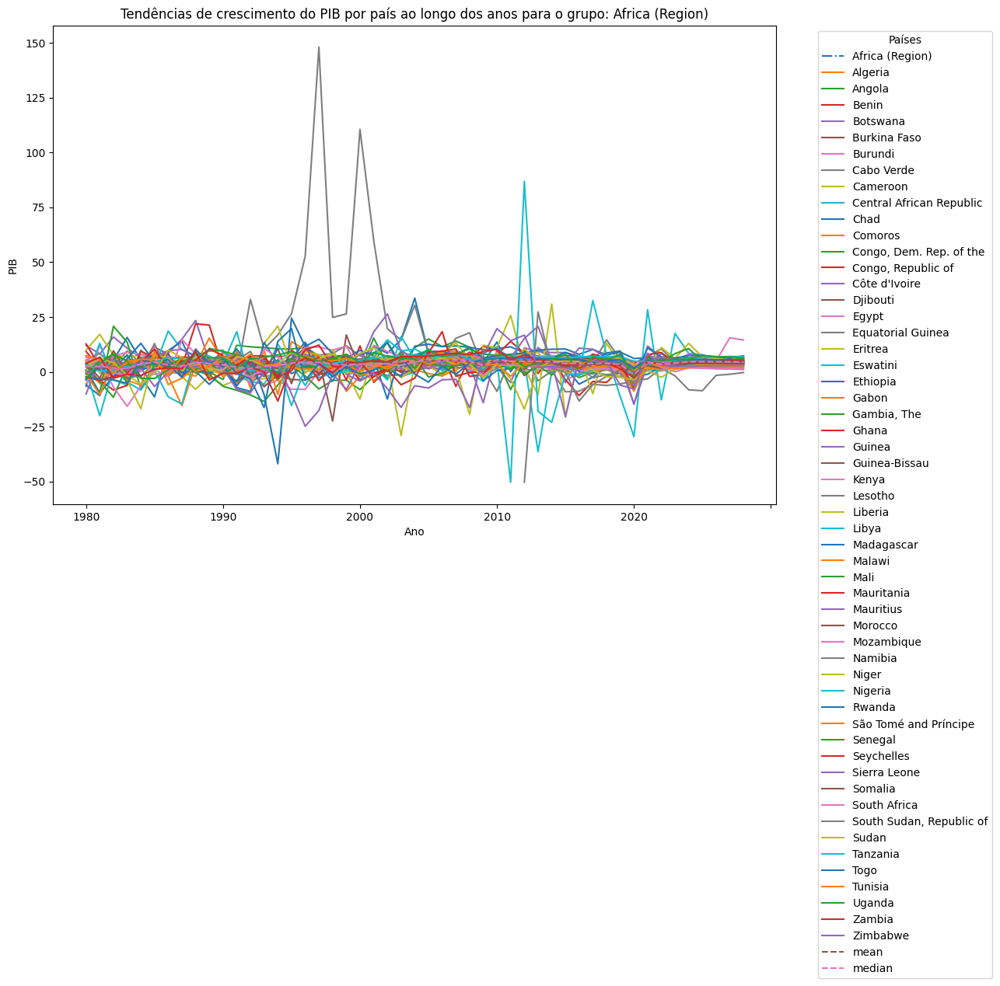

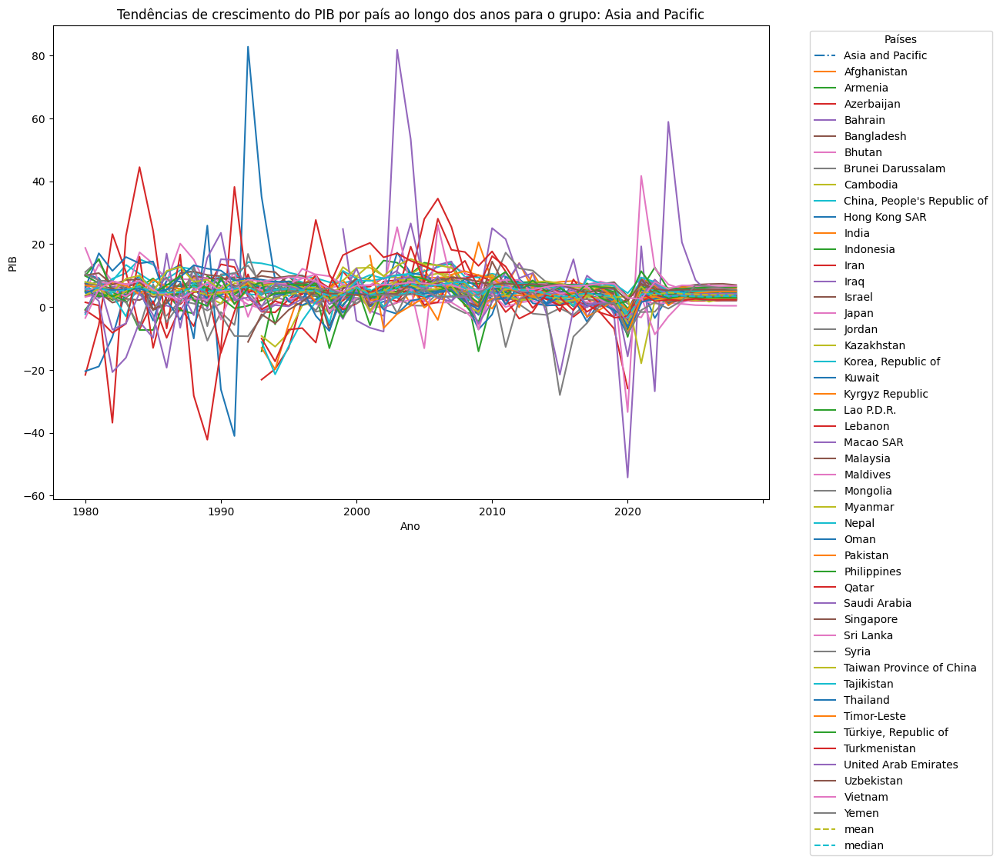

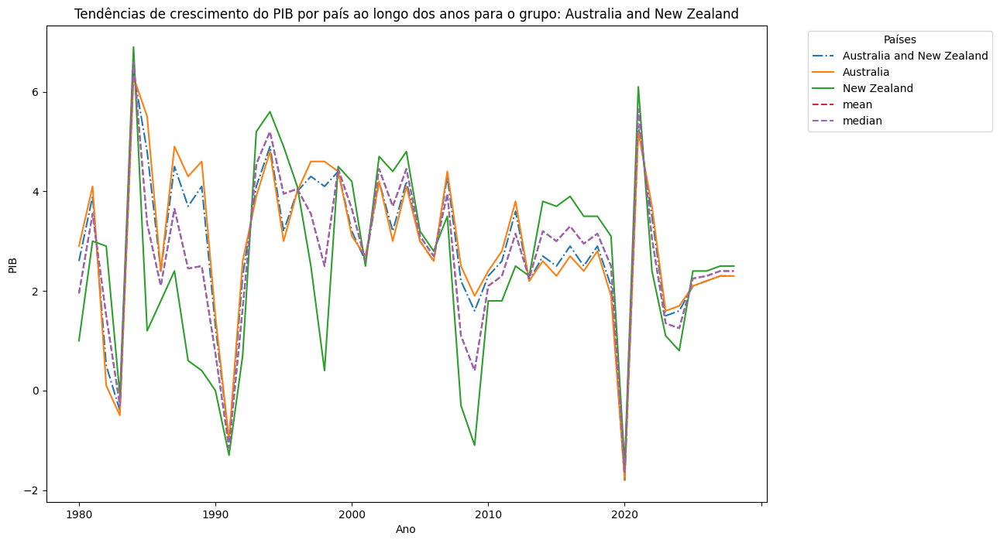

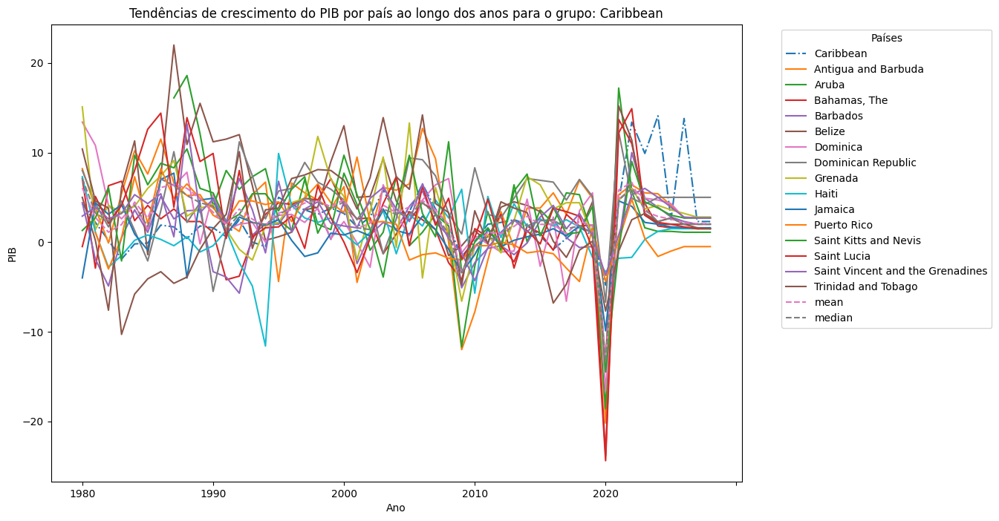

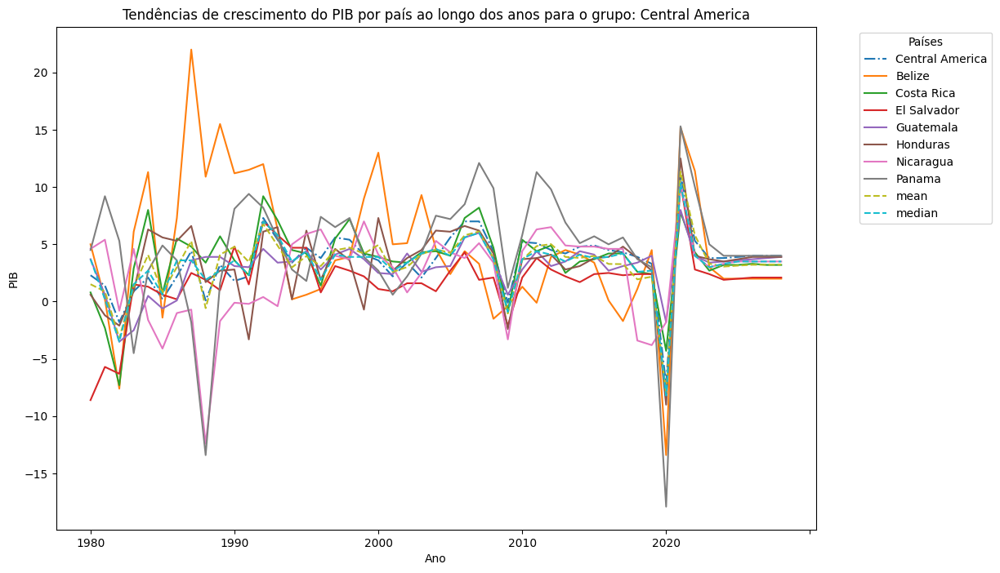

...

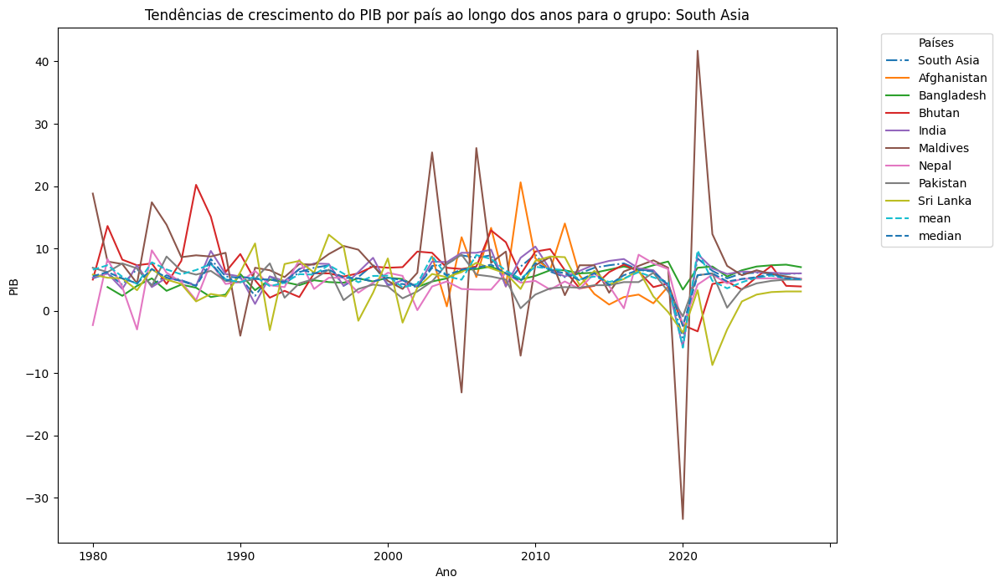

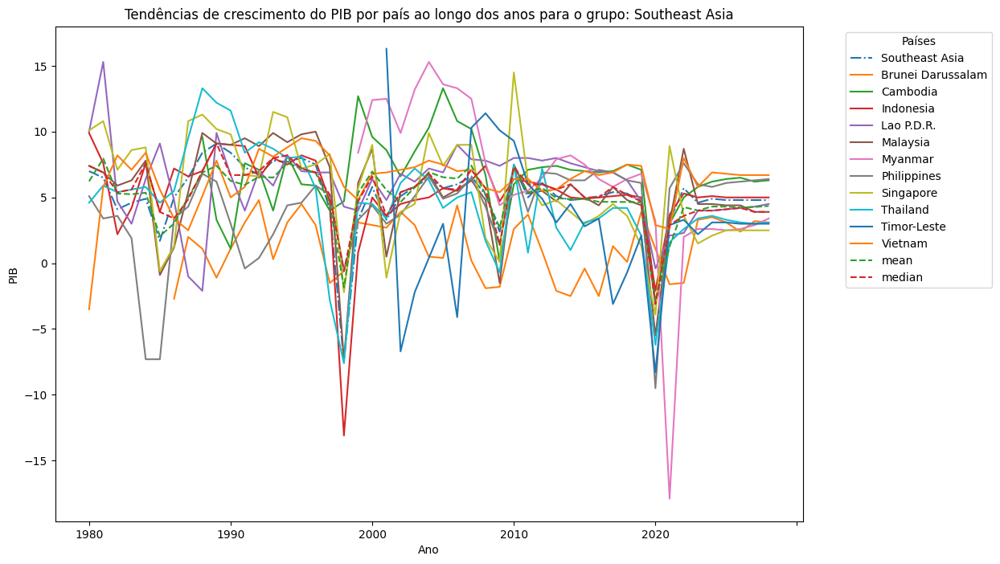

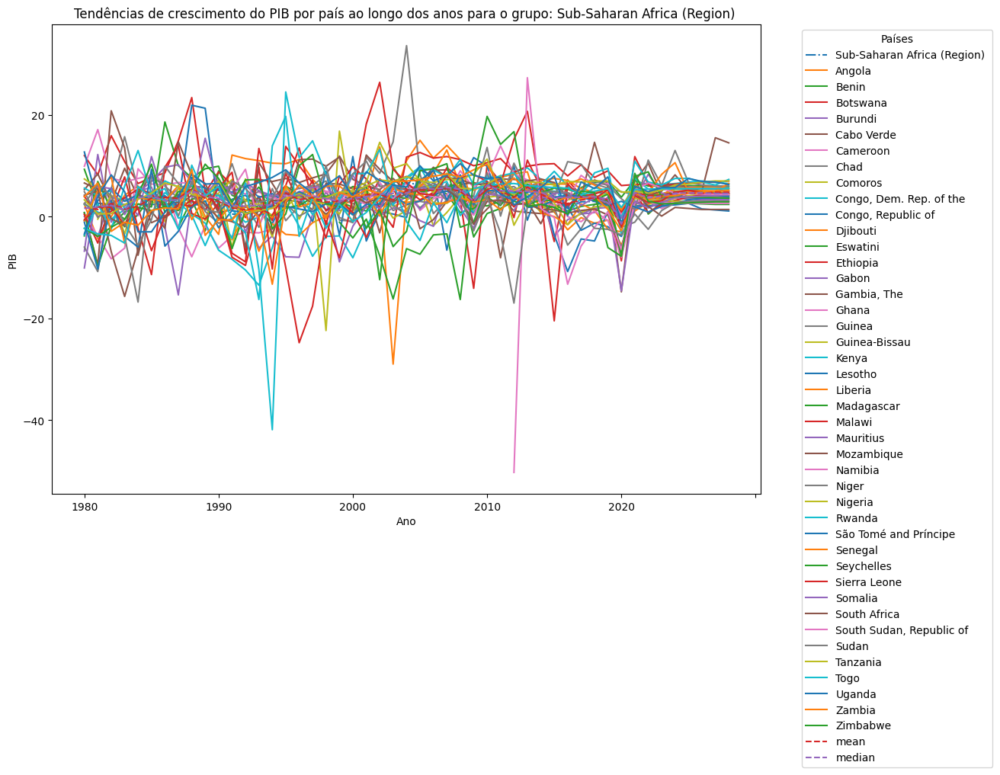

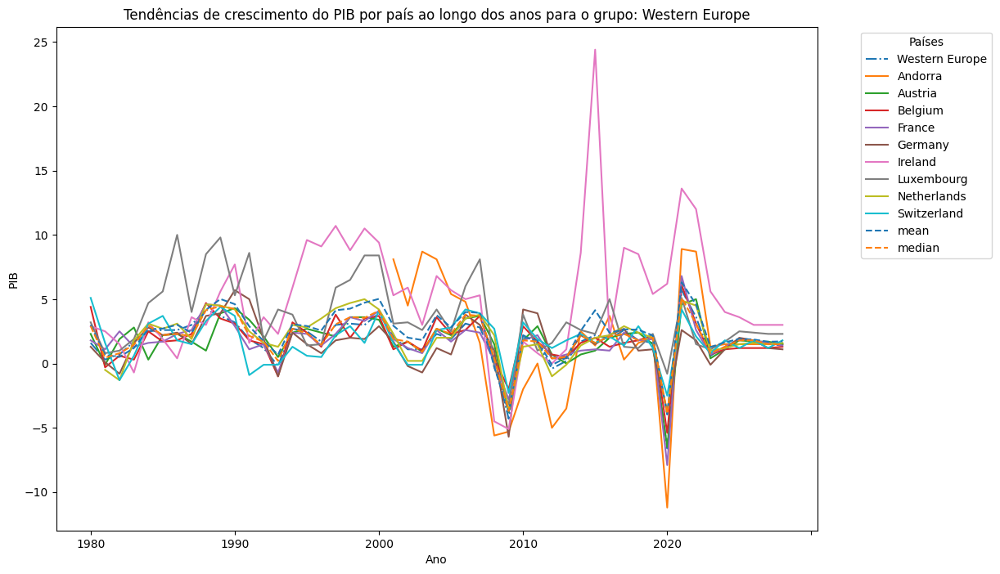

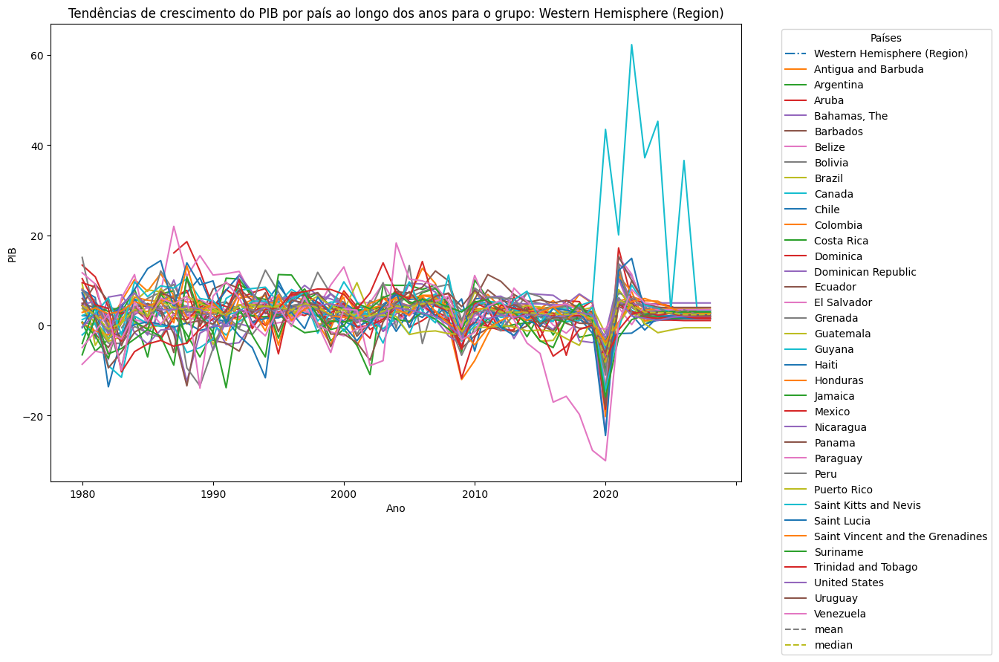

In [56]:
# Plotando os dados de PIB dos paises, região, média e mediana, agrupados por região
for region in region_mapping:
    plot_gdp_line_chart_by_group(region_mapping[region], region)

Analisando os dados e as principais estatísticas para os grupos.

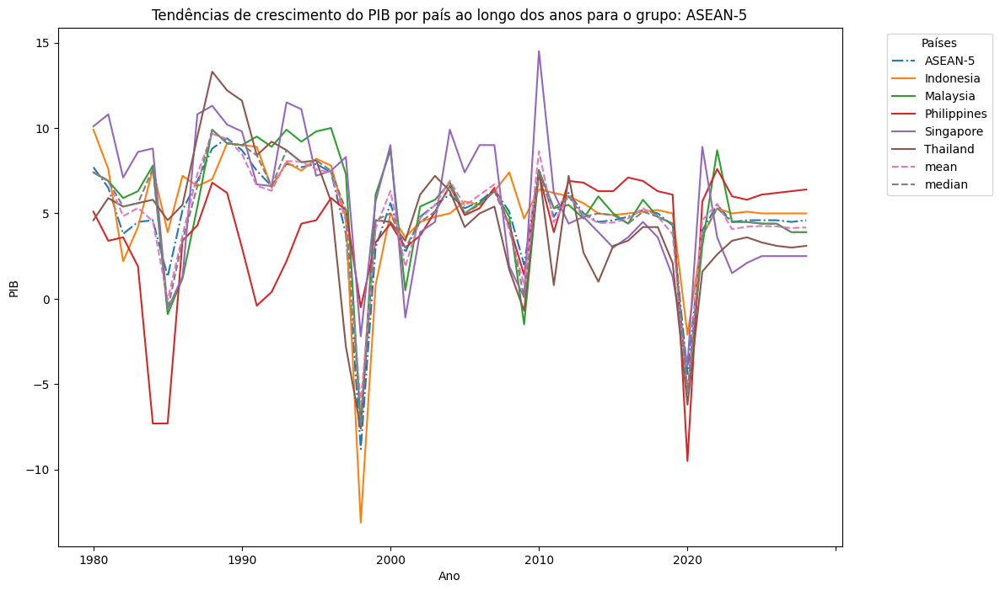

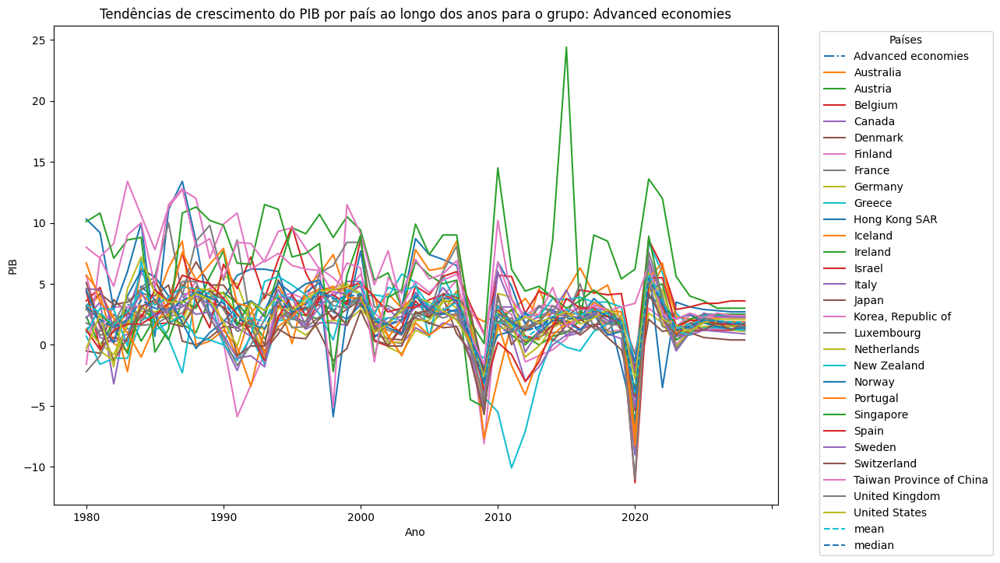

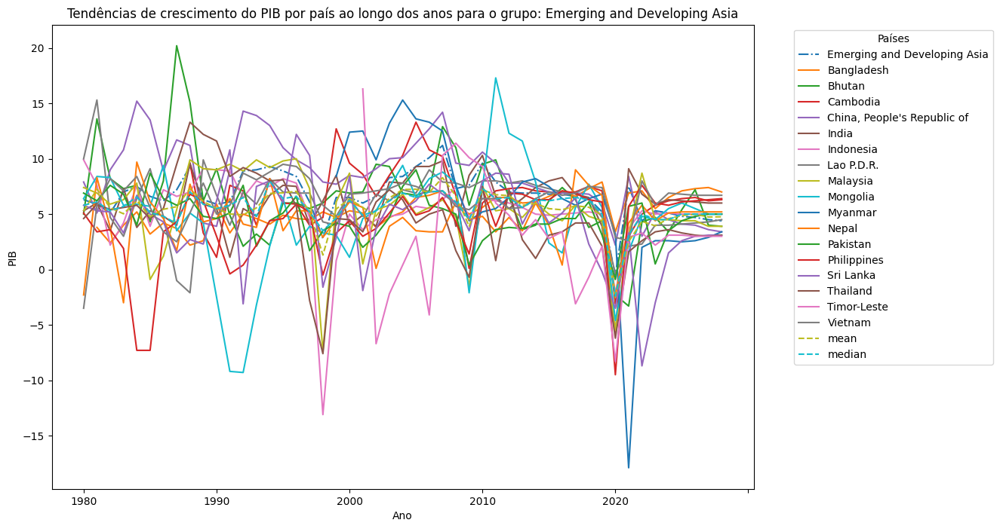

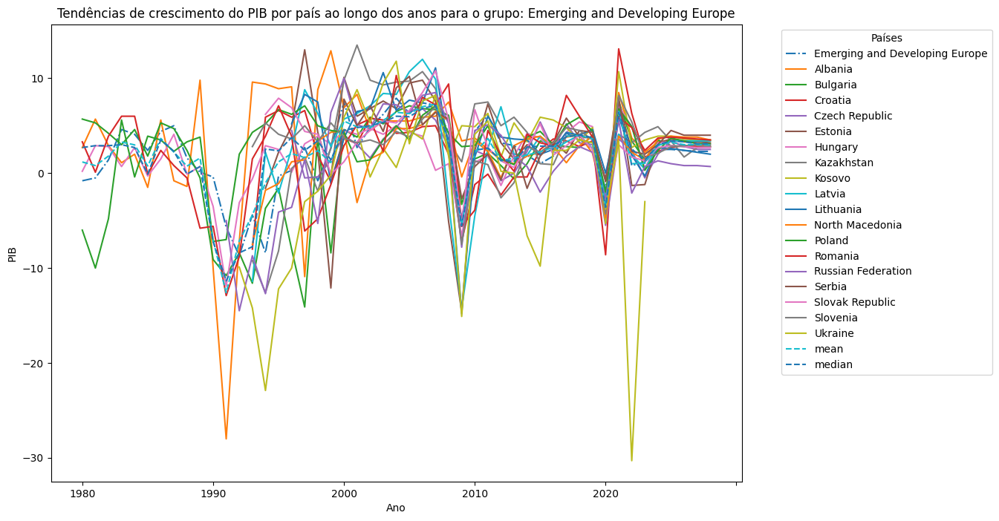

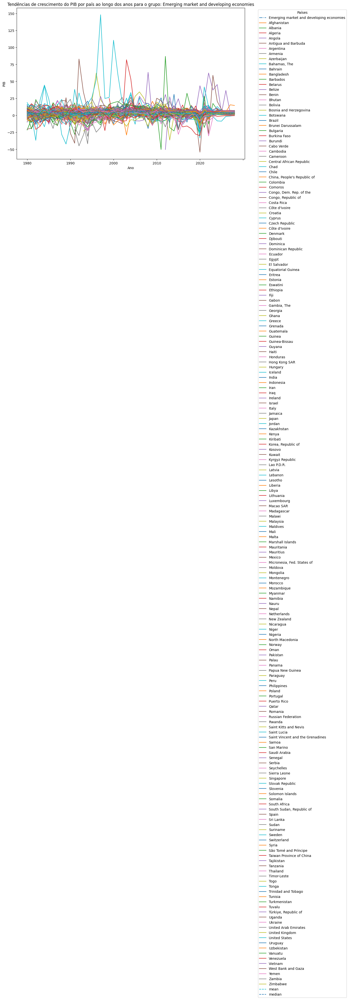

...

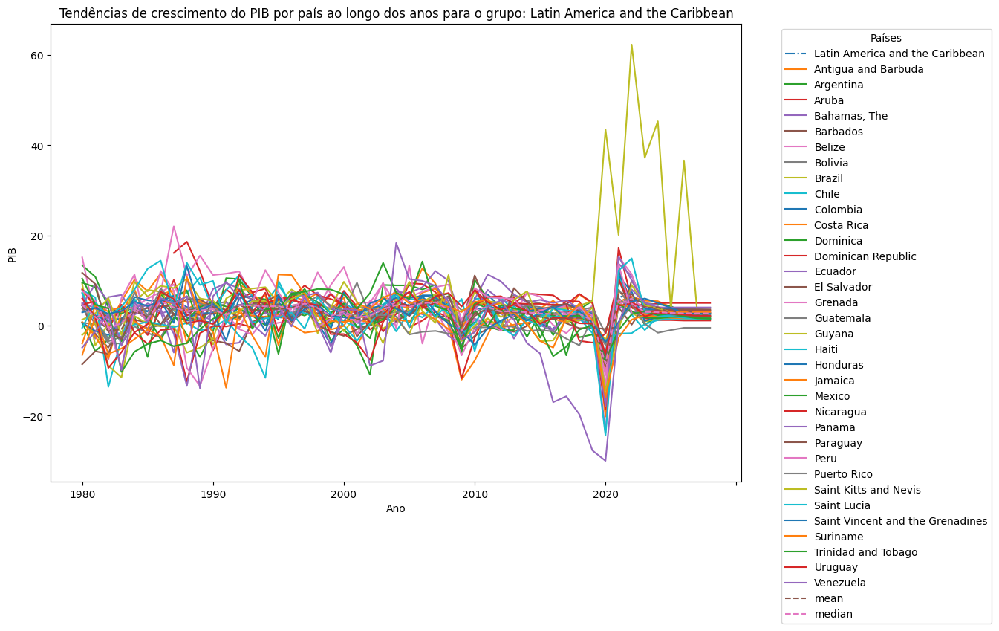

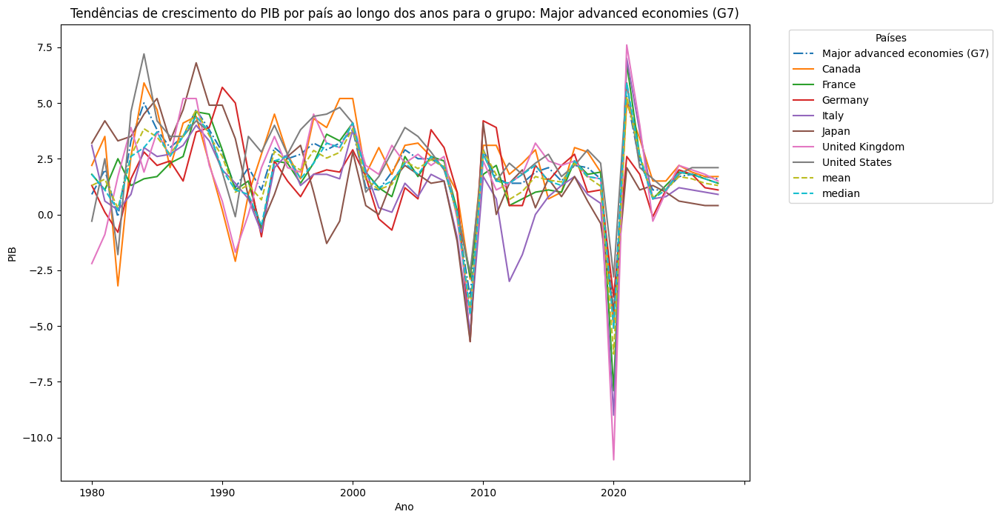

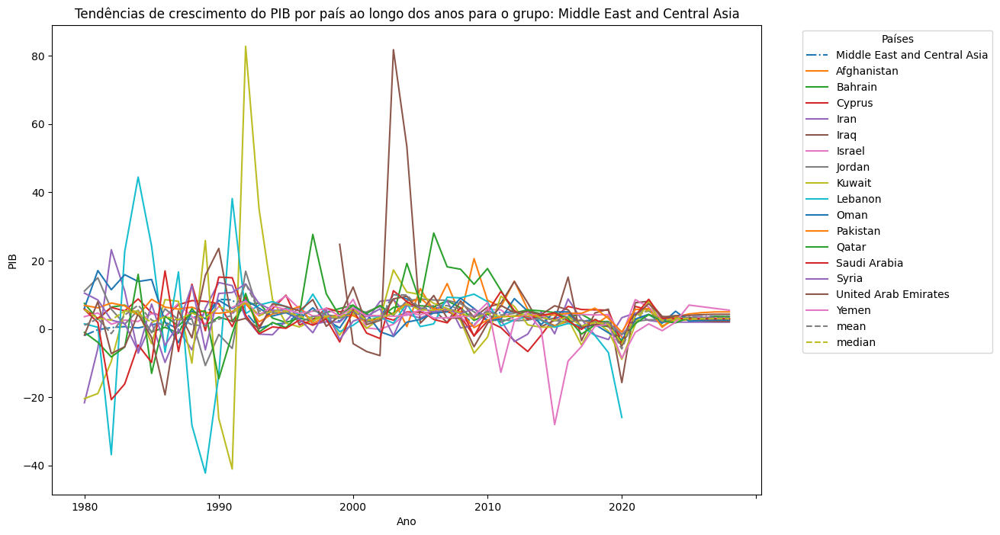

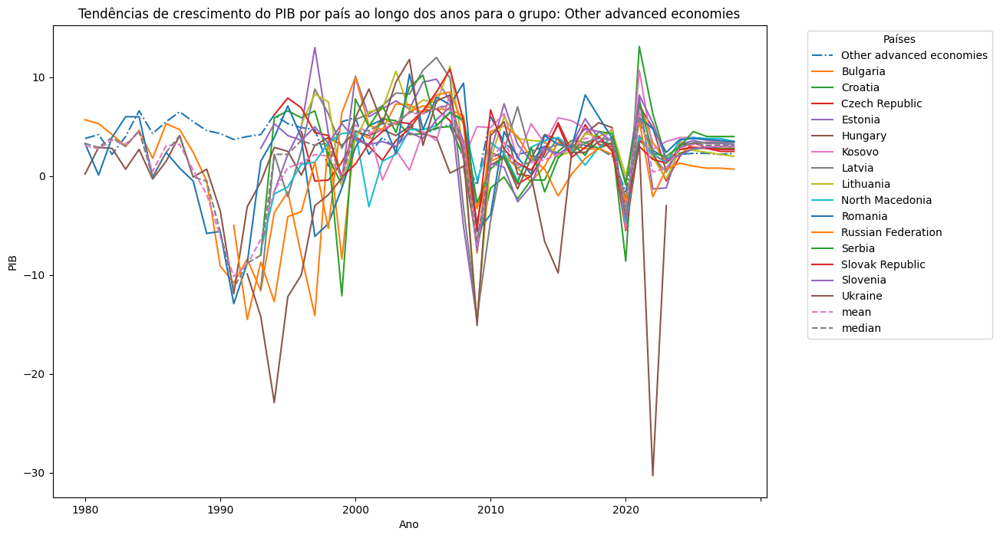

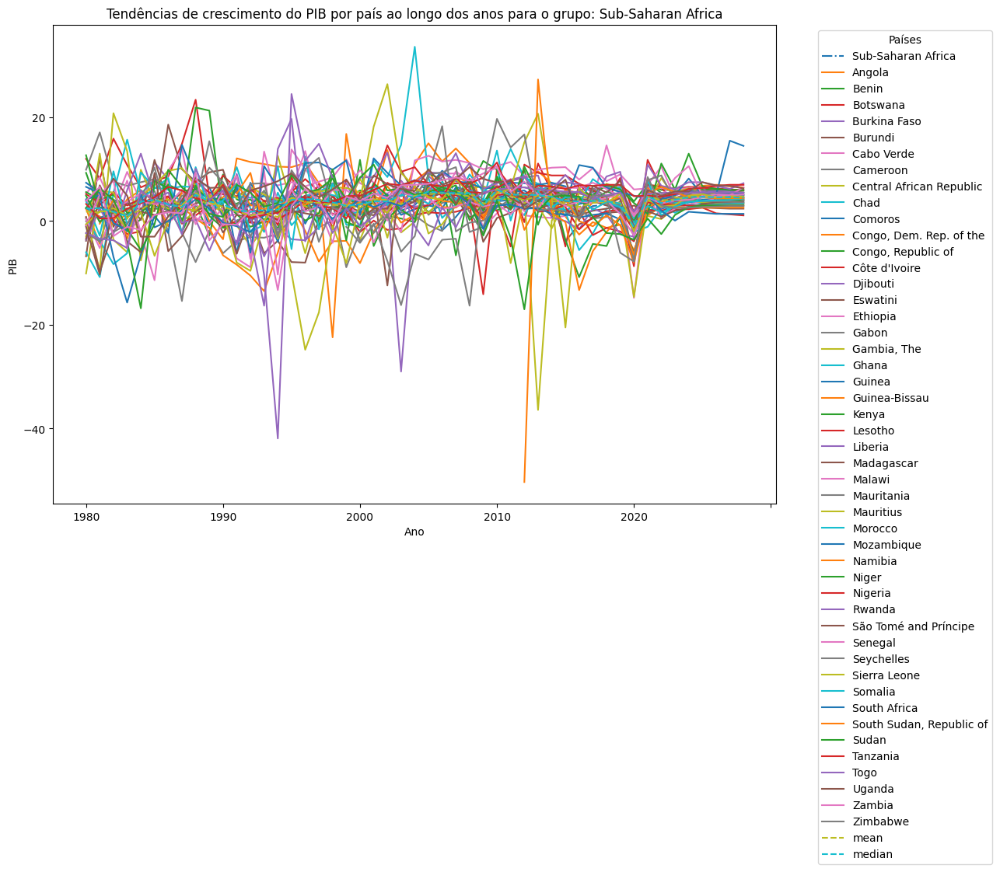

In [57]:
# Plotando os dados de PIB dos paises, grupo, média e mediana, agrupados por grupo econômico
for column in group_mapping:
    plot_gdp_line_chart_by_group(group_mapping[column], column)

In [58]:
""" Analisando os gráficos acima, é possível observar que a mediana é menos afetada
por outliers que a média. Por isso, ela será utilizada para substituir as linhas sem dados"""

# Obtendo as colunas com dados faltantes no DataFrame
na_df = plot_df.copy()
columns_with_nan = na_df.columns[na_df.isna().any()]

# Verificando quantos grupos e regiões cada um dos países faz parte
nan_countries_groups_count = {country: count for country, count in groups_and_regions_count.items() if country in columns_with_nan}
nan_countries_groups_count = sorted(nan_countries_groups_count.items())
print(nan_countries_groups_count)


[('Afghanistan', {'groups': 2, 'regions': 2}), ('Andorra', {'groups': 0, 'regions': 1}), ('Armenia', {'groups': 1, 'regions': 2}), ('Aruba', {'groups': 1, 'regions': 2}), ('Azerbaijan', {'groups': 1, 'regions': 2}), ('Bangladesh', {'groups': 2, 'regions': 2}), ('Belarus', {'groups': 1, 'regions': 1}), ('Bosnia and Herzegovina', {'groups': 1, 'regions': 0}), ('Brunei Darussalam', {'groups': 1, 'regions': 2}), ('Cambodia', {'groups': 2, 'regions': 2}), ('Croatia', {'groups': 4, 'regions': 0}), ('Czech Republic', {'groups': 4, 'regions': 1}), ('Djibouti', {'groups': 2, 'regions': 2}), ('Eritrea', {'groups': 1, 'regions': 1}), ('Estonia', {'groups': 5, 'regions': 0}), ('Georgia', {'groups': 1, 'regions': 1}), ('Guinea-Bissau', {'groups': 2, 'regions': 2}), ('Iraq', {'groups': 2, 'regions': 2}), ('Kazakhstan', {'groups': 2, 'regions': 2}), ('Kosovo', {'groups': 3, 'regions': 0}), ('Kyrgyz Republic', {'groups': 1, 'regions': 2}), ('Latvia', {'groups': 5, 'regions': 0}), ('Lebanon', {'groups'

Analisando os dados de PIB mundial no último ano (2022), vemos que o pib
possui comportamento semelhante dentro das mesmas regiões. No entanto, há diferenças bastante significativas em relação aos grupos. Outro ponto importante, há países muitos países que não fazem parte de grupo nenhum e muitos grupos que foram criados em épocas posteriores ao pib de análise.

Dessa forma, será priorizado primeiro as regiões e depois os grupos. Cada país
participante de mais de uma região/grupo, será escolhido a região/grupo que mais
o representar. 

In [59]:
# Ajustando os grupos e regiões, para que os países sem dados apareçam apenas no grupo
# mais representativo para ele, conforme os gráficos acima
updated_region_mapping = {
    'Africa (Region)': ['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo, Dem. Rep. of the', 'Congo, Republic of ', 'Côte d\'Ivoire', 'Djibouti', 'Egypt', 'Equatorial Guinea', 'Eritrea', 'Eswatini', 'Ethiopia', 'Gabon', 'Gambia, The', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Kenya', 'Lesotho', 'Liberia', 'Libya', 'Madagascar', 'Malawi', 'Mali', 'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda', 'São Tomé and Príncipe', 'Senegal', 'Seychelles', 'Sierra Leone', 'South Africa', 'South Sudan, Republic of', 'Sudan', 'Tanzania', 'Togo', 'Tunisia', 'Uganda', 'Zambia'],
    'Asia and Pacific': ['Afghanistan', 'Armenia', 'Bahrain', 'Bhutan', 'Brunei Darussalam', 'Cambodia', 'China, People\'s Republic of', 'Hong Kong SAR', 'India', 'Indonesia', 'Iran', 'Israel', 'Japan', 'Jordan', 'Kazakhstan', 'Korea, Republic of', 'Kuwait', 'Kyrgyz Republic', 'Lao P.D.R.', 'Macao SAR', 'Malaysia', 'Maldives', 'Mongolia', 'Myanmar', 'Nepal', 'Oman', 'Pakistan', 'Philippines', 'Qatar', 'Saudi Arabia', 'Singapore', 'Sri Lanka', 'Syria', 'Taiwan Province of China', 'Tajikistan', 'Thailand', 'Timor-Leste', 'Turkmenistan', 'Türkiye, Republic of', 'United Arab Emirates', 'Uzbekistan', 'Vietnam', 'Yemen'],
    'Australia and New Zealand': ['Australia', 'New Zealand'],
    'Caribbean': ['Antigua and Barbuda', 'Aruba', 'Bahamas, The', 'Barbados', 'Belize', 'Dominica', 'Dominican Republic', 'Grenada', 'Haiti', 'Jamaica', 'Puerto Rico', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Trinidad and Tobago'],
    'Central America': ['Belize', 'Costa Rica', 'El Salvador', 'Guatemala', 'Honduras', 'Nicaragua', 'Panama'],
    'Central Asia and the Caucasus': [],
    'East Asia': ['China, People\'s Republic of', 'Hong Kong SAR', 'Japan', 'Korea, Republic of', 'Mongolia', 'Taiwan Province of China'],
    'Eastern Europe ': ['Albania', 'Belarus', 'Bulgaria', 'Czech Republic', 'Hungary', 'Poland', 'Romania', 'Russian Federation', 'Slovak Republic', 'Ukraine'],
    'Europe': ['Austria', 'Belgium', 'Denmark', 'Finland', 'France', 'Germany', 'Greece', 'Iceland', 'Ireland', 'Italy', 'Luxembourg', 'Netherlands', 'Norway', 'Portugal', 'Spain', 'Sweden', 'Switzerland', 'United Kingdom'],
    'Middle East (Region)': ['Bahrain', 'Cyprus', 'Iran', 'Iraq', 'Israel', 'Jordan', 'Kuwait', 'Lebanon', 'Oman', 'Qatar', 'Saudi Arabia', 'Türkiye, Republic of', 'United Arab Emirates'],
    'North Africa': ['Algeria', 'Egypt', 'Libya', 'Mauritania', 'Morocco', 'Sudan', 'Tunisia'],
    'North America': ['Canada', 'Mexico', 'United States'],
    'Pacific Islands ': ['Fiji', 'Kiribati', 'Marshall Islands', 'Micronesia, Fed. States of', 'Nauru', 'New Zealand', 'Palau', 'Papua New Guinea', 'Samoa', 'Solomon Islands', 'Tonga', 'Tuvalu', 'Vanuatu'],
    'South America': ['Argentina', 'Bolivia', 'Brazil', 'Chile', 'Colombia', 'Ecuador', 'Guyana', 'Paraguay', 'Peru', 'Suriname', 'Uruguay', 'Venezuela'],
    'South Asia': ['Bangladesh', 'Bhutan', 'India', 'Maldives', 'Nepal', 'Pakistan', 'Sri Lanka'],
    'Southeast Asia': ['Indonesia', 'Lao P.D.R.', 'Malaysia', 'Philippines', 'Singapore', 'Thailand', 'Vietnam'],
    'Sub-Saharan Africa (Region) ': ['Angola', 'Benin', 'Botswana', 'Burundi', 'Cabo Verde', 'Cameroon', 'Chad', 'Comoros', 'Congo, Dem. Rep. of the', 'Congo, Republic of ', 'Eswatini', 'Ethiopia', 'Gabon', 'Gambia, The', 'Ghana', 'Guinea', 'Kenya', 'Lesotho', 'Madagascar', 'Malawi', 'Mauritius', 'Mozambique', 'Niger', 'Rwanda', 'São Tomé and Príncipe', 'Senegal', 'Seychelles', 'Sierra Leone', 'Somalia', 'South Africa', 'Sudan', 'Tanzania', 'Togo', 'Uganda', 'Zambia', 'Zimbabwe'],
    'Western Europe': ['Andorra', 'Austria', 'Belgium', 'France', 'Germany', 'Ireland', 'Luxembourg', 'Switzerland'],
    'Western Hemisphere (Region)': ['Antigua and Barbuda', 'Argentina', 'Bahamas, The', 'Barbados', 'Belize', 'Bolivia', 'Brazil', 'Canada', 'Chile', 'Colombia', 'Costa Rica', 'Dominica', 'Dominican Republic', 'Ecuador', 'El Salvador', 'Grenada', 'Guatemala', 'Guyana', 'Haiti', 'Honduras', 'Jamaica', 'Mexico',  'Nicaragua', 'Panama', 'Paraguay', 'Peru', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Suriname', 'Trinidad and Tobago', 'United States', 'Uruguay'],
}

updated_group_mapping = {
    'ASEAN-5': ['Indonesia', 'Malaysia', 'Philippines', 'Singapore', 'Thailand'],
    'Advanced economies': ['Australia', 'Austria', 'Belgium', 'Canada', 'Denmark', 'Finland', 'France', 'Germany', 'Greece', 'Hong Kong SAR', 'Iceland', 'Ireland', 'Israel', 'Italy', 'Japan', 'Korea, Republic of', 'Luxembourg', 'New Zealand', 'Norway', 'Portugal', 'Singapore', 'Spain', 'Sweden', 'Switzerland', 'Taiwan Province of China', 'United Kingdom', 'United States'],
    'Emerging and Developing Asia': ['Bhutan', 'China, People\'s Republic of', 'India', 'Indonesia', 'Lao P.D.R.', 'Malaysia', 'Mongolia', 'Nepal', 'Pakistan', 'Philippines', 'Sri Lanka', 'Thailand', 'Vietnam'],
    'Emerging and Developing Europe': ['Albania', 'Bulgaria', 'Hungary', 'Poland', 'Romania'],
    'Emerging market and developing economies': ['Albania', 'Algeria', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Azerbaijan', 'Bahamas, The', 'Bahrain', 'Barbados', 'Belize', 'Benin', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cameroon', 'Central African Republic', 'Chad', 'Chile', "China, People's Republic of", 'Colombia', 'Comoros', 'Congo, Dem. Rep. of the', 'Congo, Republic of ', 'Costa Rica', 'Côte d\'Ivoire', 'Cyprus', "Côte d'Ivoire", 'Denmark', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eswatini', 'Ethiopia', 'Fiji', 'Gabon', 'Gambia, The', 'Georgia', 'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Guinea', 'Guyana', 'Haiti', 'Honduras', 'Hong Kong SAR', 'Hungary', 'Iceland', 'India', 'Indonesia', 'Iran', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Jordan', 'Kenya', 'Kiribati', 'Korea, Republic of', 'Kuwait', 'Lao P.D.R.', 'Lesotho', 'Libya', 'Luxembourg', 'Madagascar', 'Malawi', 'Malaysia', 'Maldives', 'Mali', 'Malta', 'Mauritius', 'Mexico', 'Moldova', 'Mongolia', 'Montenegro', 'Morocco', 'Mozambique', 'Nepal', 'New Zealand', 'Nicaragua', 'Niger', 'Norway', 'Oman', 'Pakistan', 'Panama', 'Papua New Guinea', 'Paraguay', 'Peru', 'Philippines', 'Poland', 'Portugal', 'Qatar', 'Romania', 'Rwanda', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Samoa', 'San Marino', 'Saudi Arabia', 'Senegal', 'Seychelles', 'Sierra Leone', 'Singapore', 'Solomon Islands', 'South Africa', 'Spain', 'Sri Lanka', 'Sudan', 'Suriname', 'Sweden', 'Switzerland', 'São Tomé and Príncipe', 'Taiwan Province of China', 'Tanzania', 'Thailand', 'Togo', 'Tonga', 'Trinidad and Tobago', 'Tunisia', 'Türkiye, Republic of', 'Uganda', 'United Arab Emirates', 'United Kingdom', 'United States', 'Uruguay', 'Vanuatu', 'Vietnam', 'West Bank and Gaza', 'Zambia'],
    'Euro area': ['Austria', 'Belgium', 'Cyprus', 'Finland', 'France', 'Germany', 'Greece', 'Ireland', 'Italy', 'Luxembourg', 'Malta', 'Portugal', 'Slovenia', 'Spain'],
    'European Union': ['Austria', 'Belgium', 'Bulgaria', 'Croatia', 'Cyprus', 'Denmark', 'Finland', 'France', 'Germany', 'Greece', 'Hungary', 'Ireland', 'Italy', 'Luxembourg', 'Malta', 'Poland', 'Portugal', 'Romania', 'Spain', 'Sweden'],
    'Latin America and the Caribbean': ['Antigua and Barbuda', 'Argentina', 'Bahamas, The', 'Barbados', 'Belize', 'Bolivia', 'Brazil', 'Chile', 'Colombia', 'Costa Rica', 'Dominica', 'Dominican Republic', 'Ecuador', 'El Salvador', 'Grenada', 'Guatemala', 'Guyana', 'Haiti', 'Honduras', 'Jamaica', 'Mexico', 'Nicaragua', 'Panama', 'Paraguay', 'Peru', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Suriname', 'Trinidad and Tobago', 'Uruguay'],
    'Major advanced economies (G7)': ['Canada', 'France', 'Germany', 'Italy', 'Japan', 'United Kingdom', 'United States'],
    'Middle East and Central Asia': ['Bahrain', 'Cyprus', 'Iran', 'Israel', 'Jordan', 'Kuwait', 'Oman', 'Pakistan', 'Qatar', 'Saudi Arabia', 'United Arab Emirates'],
    'Other advanced economies': ['Bulgaria', 'Estonia', 'Hungary', 'Kosovo', 'Latvia', 'Lithuania', 'North Macedonia ', 'Romania', 'Serbia'],
    'Sub-Saharan Africa': ['Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo, Dem. Rep. of the', 'Congo, Republic of ', 'Côte d\'Ivoire', 'Eswatini', 'Ethiopia', 'Gabon', 'Gambia, The', 'Ghana', 'Guinea', 'Kenya', 'Lesotho', 'Madagascar', 'Malawi', 'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Rwanda', 'São Tomé and Príncipe', 'Senegal', 'Seychelles', 'Sierra Leone', 'South Africa', 'Sudan', 'Tanzania', 'Togo', 'Uganda', 'Zambia'],
}

updated_regions_and_groups_mapping = {**updated_region_mapping, **updated_group_mapping}

In [60]:
# Obtendo o grupo escolhido para cada país com dados faltantes
complete_df = na_df.copy()
countries_with_na_groups = {country: group for group, country_list in updated_regions_and_groups_mapping.items() for country in country_list if country in columns_with_nan}

# Preenchendo as colunas sem dados com as medianas
for country_to_fill, column in countries_with_na_groups.items():
    median = get_yearly_gdp_median_by_group(regions_and_groups_mapping[column])
    complete_df[country_to_fill].fillna(median, inplace=True)

In [61]:
# Fazendo o mesmo para as regiões e grupos, utilizando os dados de países já preenchidos
groups_regions = [*groups, *regions]

for column in groups_regions:
    median = get_yearly_gdp_median_by_group(regions_and_groups_mapping[column], complete_df)
    complete_df[column].fillna(median, inplace=True)

complete_df = complete_df.T.rename_axis('Real GDP growth (Annual percent change)')

Iniciando o modelo de predição dos dados de crescimento do GDP para os anos de 2024, 2025, 2026, 2027 e 2028.

O modelo escolhido para a previsão foi o ARIMA. 

In [62]:
# Para fazer a predição dos dados futuros, primeiramente iremos remover os anos após 2023
columns_to_remove = [2024, 2025, 2026, 2027, 2028]
real_df = complete_df.drop(columns=columns_to_remove)
real_df = real_df.T

# Para utilizar o modelo, é preciso que os anos estejam no formato de data
# Convertendo os anos para o formato datetime
real_df.index = pd.to_datetime(real_df.index, format='%Y')

In [63]:
# Função para fazer a previsão de dados futuros com o auto_arima
def get_countries_forecasts(dataframe):
    # Inicializando uma lista vazia para guardar os dados de previsão
    forecast_data = []

    # Gerando as previsões para os países do DataFrame
    for column in dataframe.columns:
        # Utilizando a função auto_arima para encontrar o melhor ARIMA a ser utilizado
        data_actual = dataframe[column]
        model = pm.auto_arima(
            data_actual,
            m=1,
            seasonal=False,
            d=None,
            test="adf",
            start_p=0,
            start_q=0,
            max_p=10,
            max_q=10,
            D=None,
            trace=True,
            error_action="ignore",
            suppress_warnings=True,
            stepwise=True,
        )

        # Gerando as previsões do país atual para 5 anos no futuro e adicionando à lista
        forecasts = model.predict(n_periods=5)
        forecast_data.append(forecasts)

    # Gerando um DataFrame com os dados de previsões
    forecast_df = pd.DataFrame(forecast_data).T
    # Corrigindo os nomes das colunas do DataFrame
    forecast_df.columns = dataframe.columns
    forecast_df.columns.name = None

    return forecast_df


# Função para unir os DataFrames de dados reais e previsões
def concat_real_forecast_dataframes(real_df, forecast_df):
    # Copiando os DataFrames originais
    data_real = real_df.copy()
    data_forecast = forecast_df.copy()

    # Adicionando uma coluna de descrição, indicando se o dado é real ou uma previsão
    data_real["desc"] = "Real"
    data_forecast["desc"] = "Previsão"

    # Combinando os dados em um único DataFrame e resetando o índice
    combined_df = pd.concat([data_real, data_forecast]).reset_index()

    # Renomeando o índice e retornando os dados unidos
    combined_df = combined_df.rename(columns={"index": "Years"})
    return combined_df

# Função para plotar os gráficos de previsões para cada país
def plot_forecast_chart_by_country(combined_df, dataframe_columns, nrow=5, ncol=2):
    # Fazendo o melt dos dados
    melted_df = combined_df.melt(id_vars=["Years", "desc"])

    # Configurando os gráficos que serão plotados
    fig, axs = plt.subplots(nrow, ncol, figsize=(25, 25))
    fig.suptitle('Previsões de crescimento do PIB de 2024-2028 (Variação percentual anual)', size=20, y=0.90)

    # Total de gráficos que serão plotados
    total_charts = nrow * ncol

    i = 0
    j = 0
    for country in dataframe_columns[:total_charts]:
        # Filtrando os DataFrames para o país que está sendo plotado
        df_plot = melted_df[melted_df["variable"] == country]

        # Plotando os dados reais e as previsões
        sns.lineplot(ax=axs[j, i], data=df_plot, x="Years", y="value", hue="desc", marker="o")

        # Configurando os títulos dos eixos e a legenda
        axs[j, i].set_xlabel(country, size=15)
        axs[j, i].set_ylabel('GDP', size=15)
        axs[j, i].legend(loc="upper left")

        # Incrementando i e j para que os gráficos sejam plotados corretamente
        i = i + 1
        if i >= ncol:
            j = j + 1
            i = 0

    plt.show()

In [64]:
# Gerando o DataFrame com as previsões para todos os países
forecast_df = get_countries_forecasts(real_df)

Performing stepwise search to minimize aic
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=311.636, Time=0.67 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=270.780, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=309.637, Time=0.01 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=253.882, Time=0.06 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=241.519, Time=0.12 sec
 ARIMA(4,2,0)(0,0,0)[0] intercept   : AIC=237.893, Time=0.07 sec
 ARIMA(5,2,0)(0,0,0)[0] intercept   : AIC=239.659, Time=0.23 sec
 ARIMA(4,2,1)(0,0,0)[0] intercept   : AIC=239.525, Time=0.26 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(5,2,1)(0,0,0)[0] intercept   : AIC=241.519, Time=0.62 sec
 ARIMA(4,2,0)(0,0,0)[0]             : AIC=235.955, Time=0.05 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=239.564, Time=0.14 sec
 ARIMA(5,2,0)(0,0,0)[0]             : AIC=237.720, Time=0.16 sec
 ARIMA(4,2,1)(0,0,0)[0]             : AIC=237.584, Time

In [65]:
# Unindo o DataFrame real com as previsões obtidas acima
final_df = concat_real_forecast_dataframes(real_df, forecast_df)

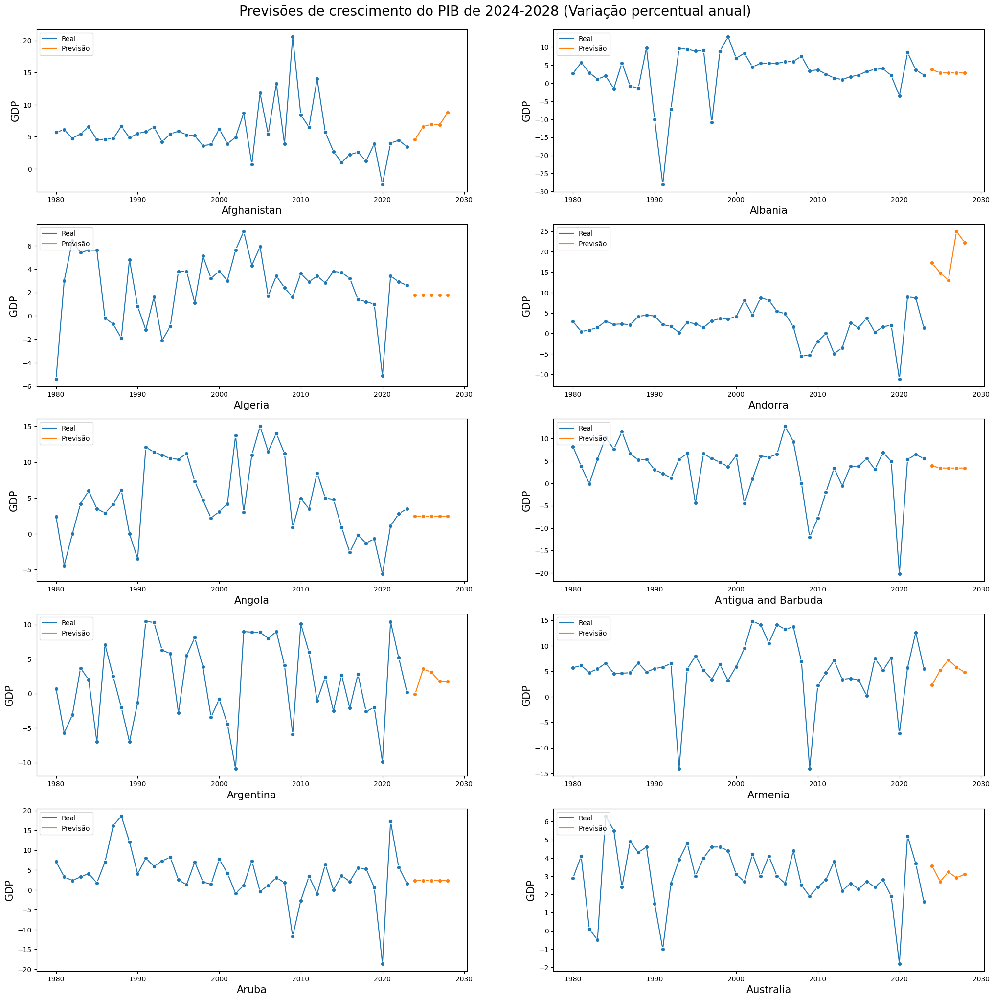

In [66]:
# Plotando o DataFrame final com as previsões
plot_forecast_chart_by_country(final_df, final_df.drop(["Years", "desc"], axis=1).columns)

In [67]:
export_df = final_df.copy()

# Transformando a coluna de datas para anos novamente
export_df["Years"] = export_df["Years"].dt.year

# Renomeando a coluns Years para o nome original
export_df = export_df.rename(columns={"Years": "Real GDP growth (Annual percent change)"}).set_index('Real GDP growth (Annual percent change)')

# Removendo a coluna de descrição
export_df.drop(columns="desc")

# Transpondo o DataFrame e enviando os dados para a planilha
export_df.T.to_csv("predicted.csv")